# Dimensionality reduction

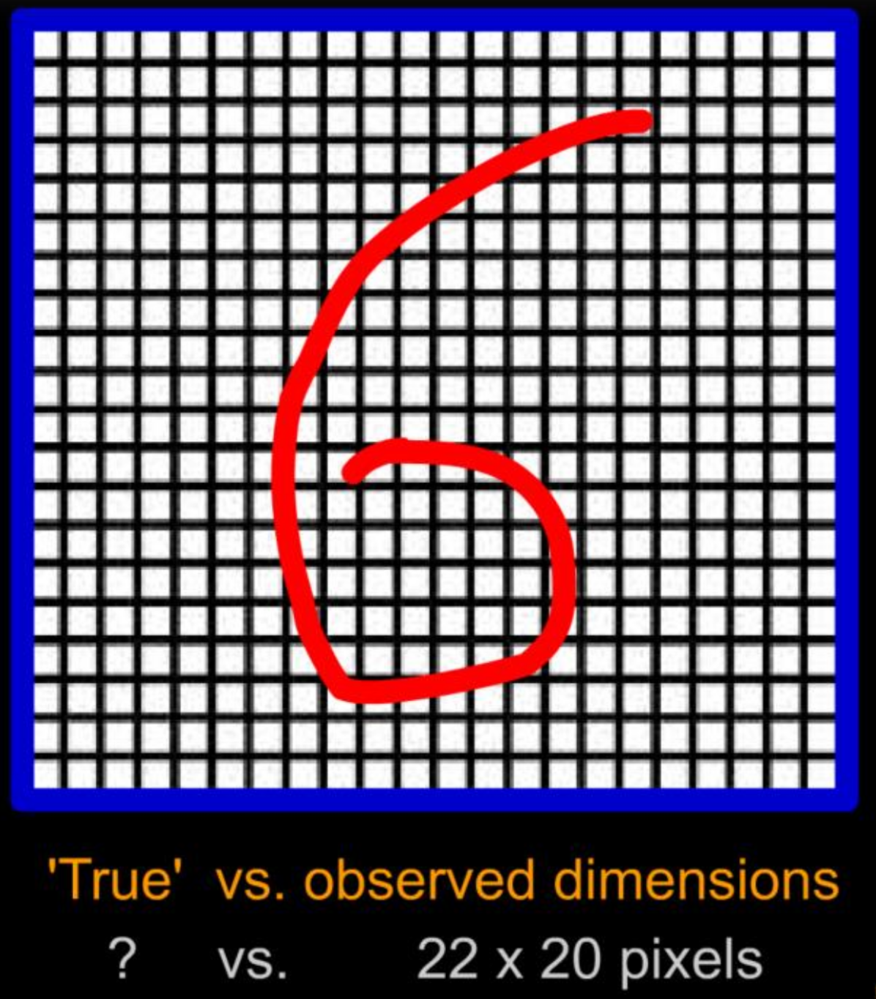
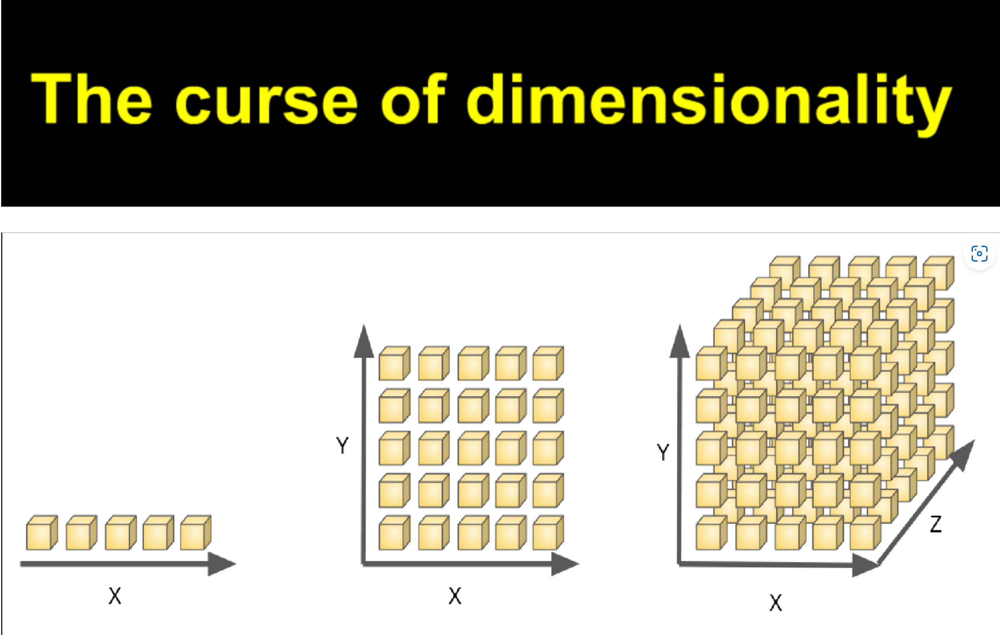
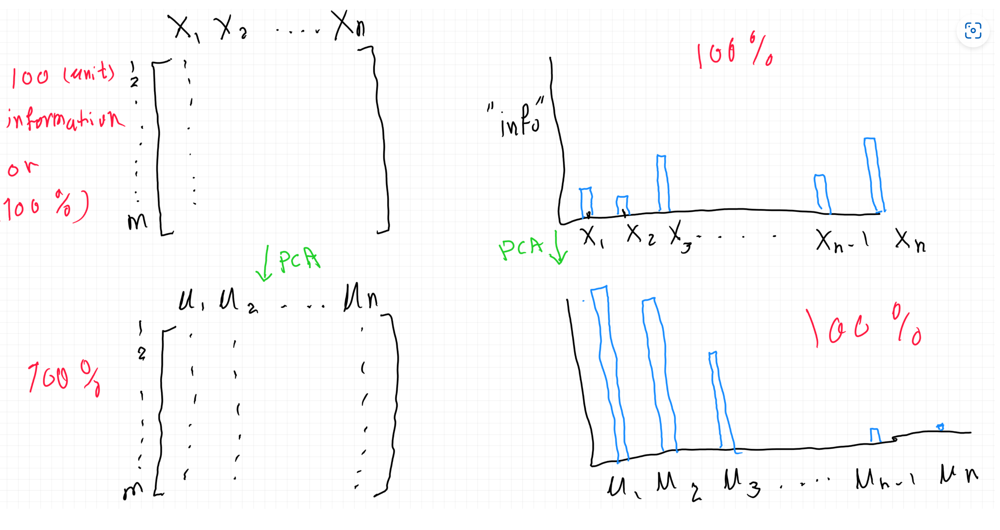


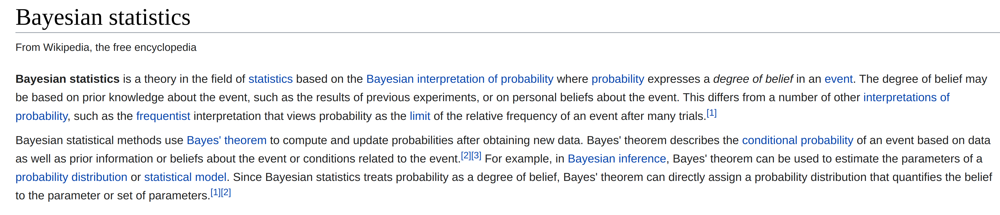
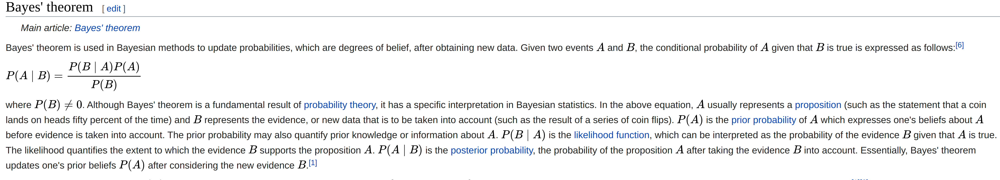

# =============================================================

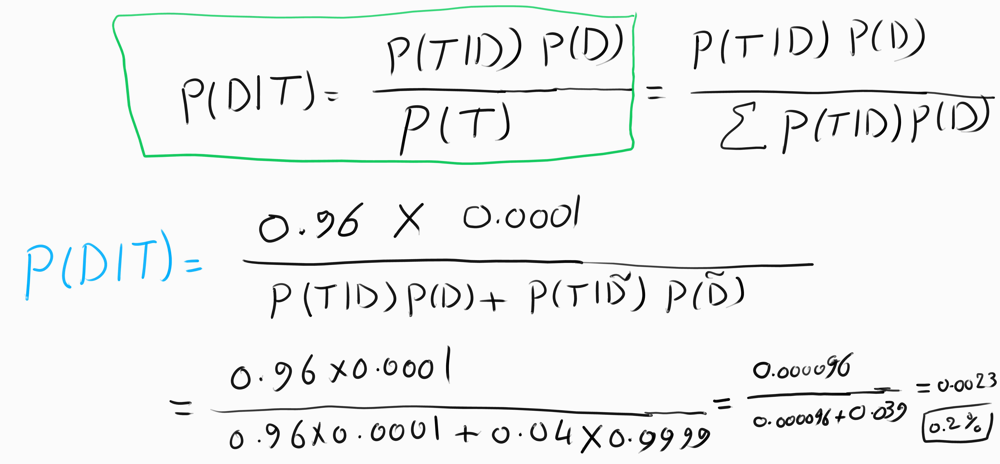

# =============================================================

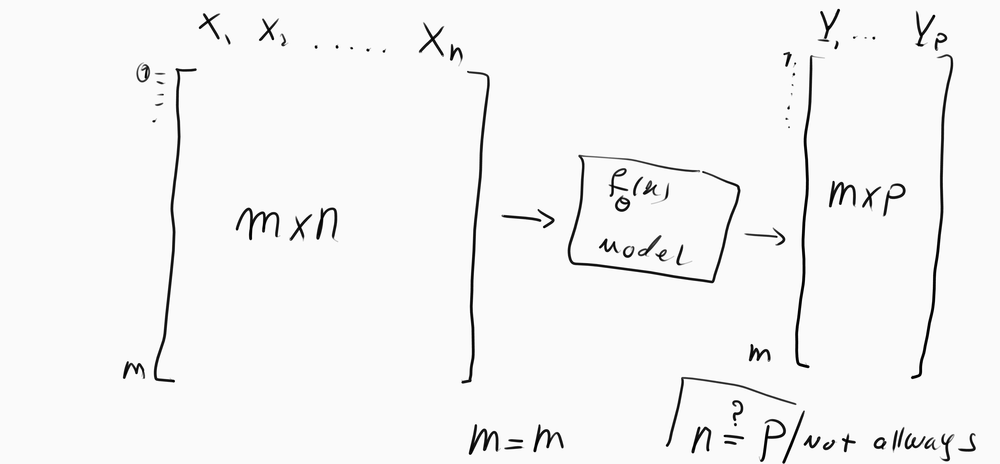

# ========================================================
# the closed form 

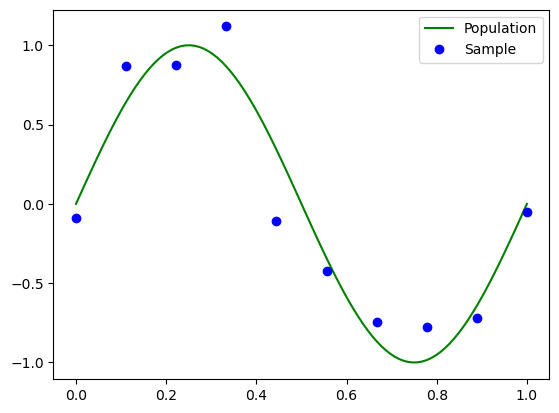

(10, 1)


In [17]:
import numpy as np
from scipy.interpolate import interp1d
from matplotlib import pyplot as plt
from sklearn.preprocessing import PolynomialFeatures

#4 Create the population
X_pop= np.linspace(0,1,100,endpoint=True)
t_pop = (np.sin(2*X_pop*np.pi))
plt.plot(X_pop,t_pop,'-g', label='Population')


# Take a sample of nt_points and add noise with factor c_noise 

nt_points=10

X= np.linspace(0,1,nt_points,endpoint=True)

t= (np.sin(2*X*np.pi))

X= np.reshape(X,(-1,1))


c_noise=.15
noise= (c_noise*np.random.randn(len(X)))


t_noise=t+noise
plt.plot(X,t_noise,'ob', label='Sample')
plt.legend()

plt.show()

t_noise= np.reshape(t_noise,(-1,1))


print(np.shape(t_noise))

# =============================================================
# Keep it simple 
# n=1 , p=1 and m=10
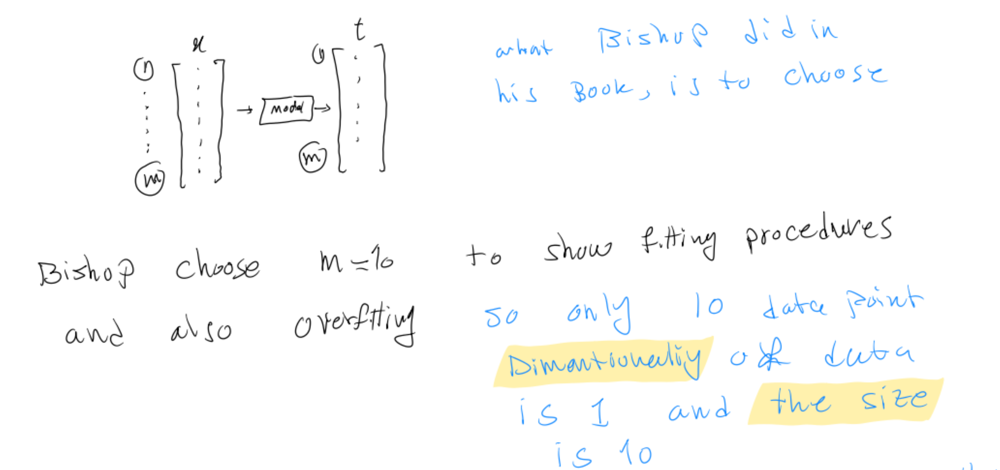
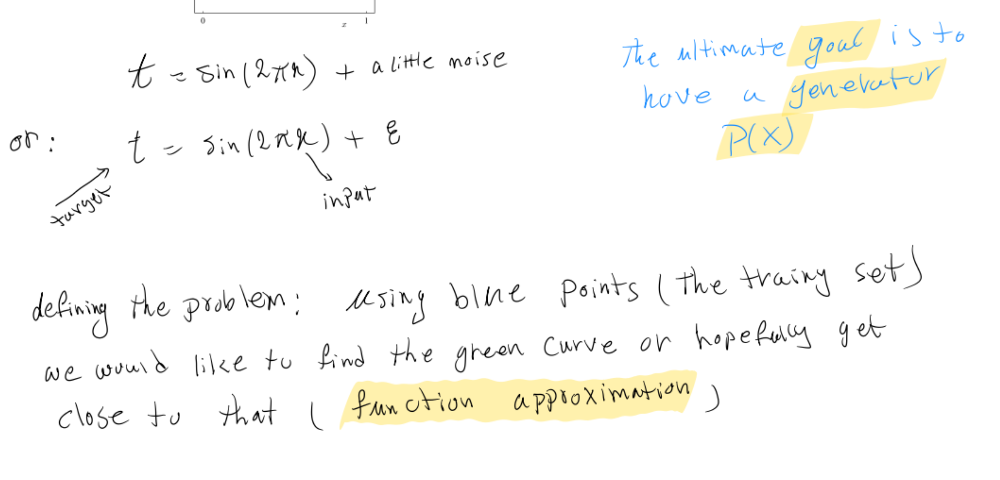
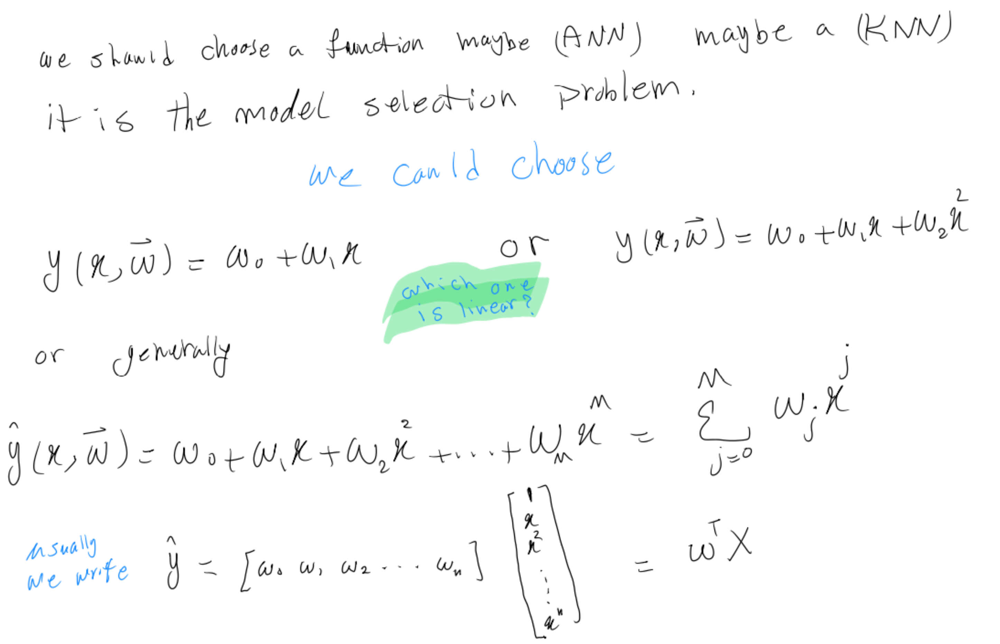
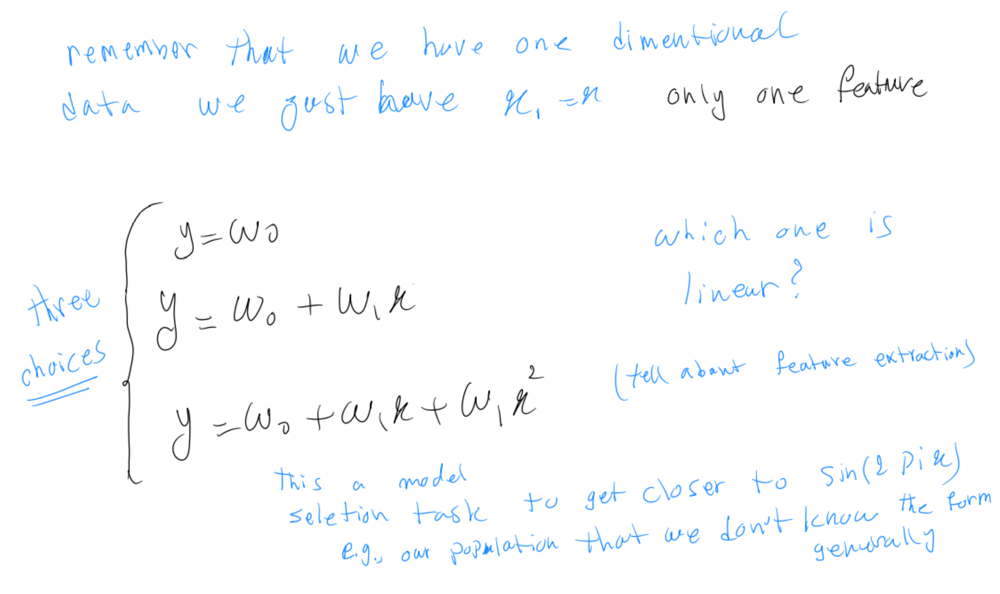
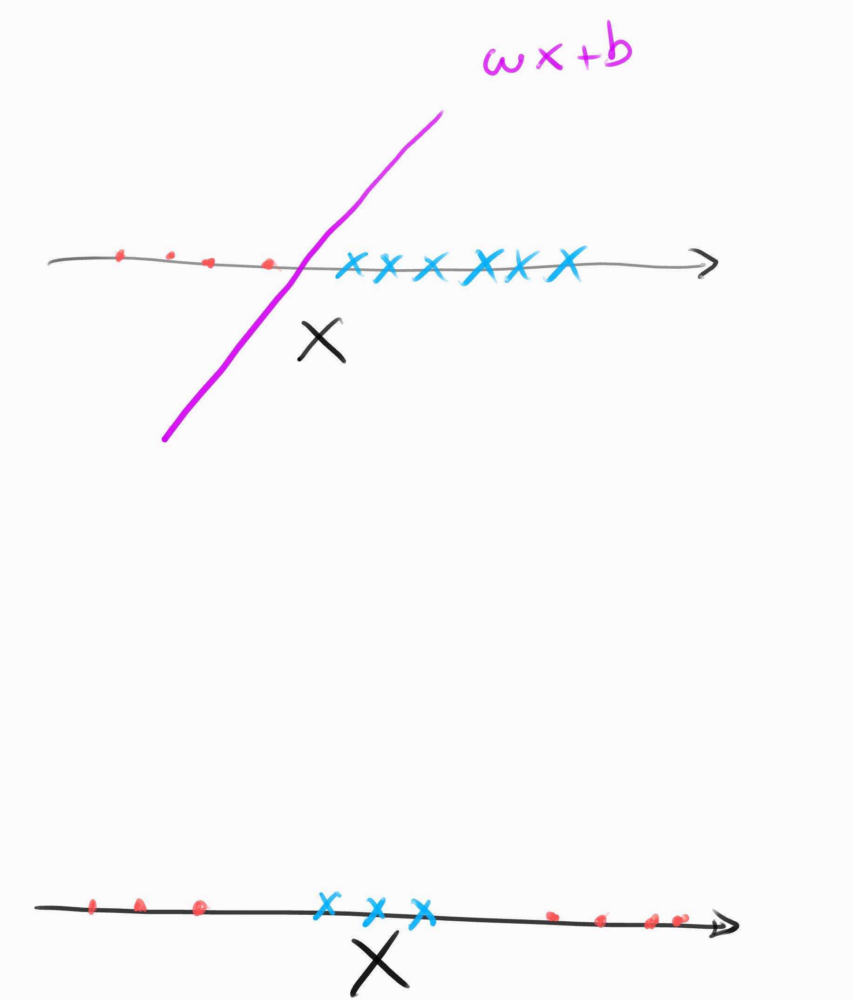
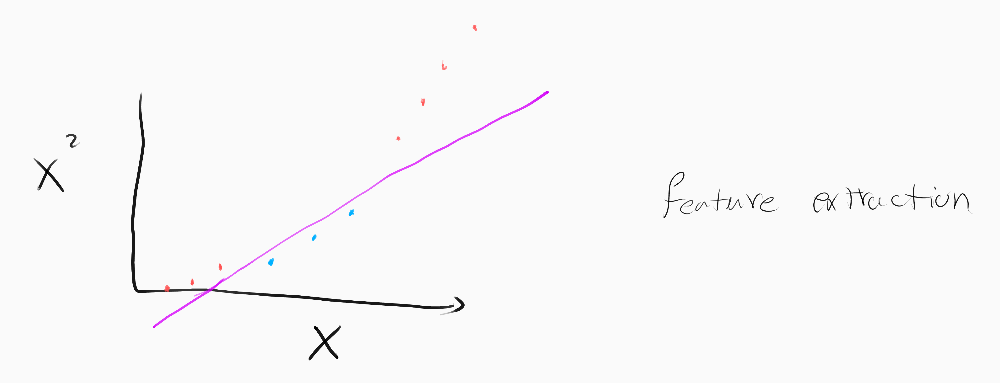

# =============================================================

# The equations can be solved in a closed form
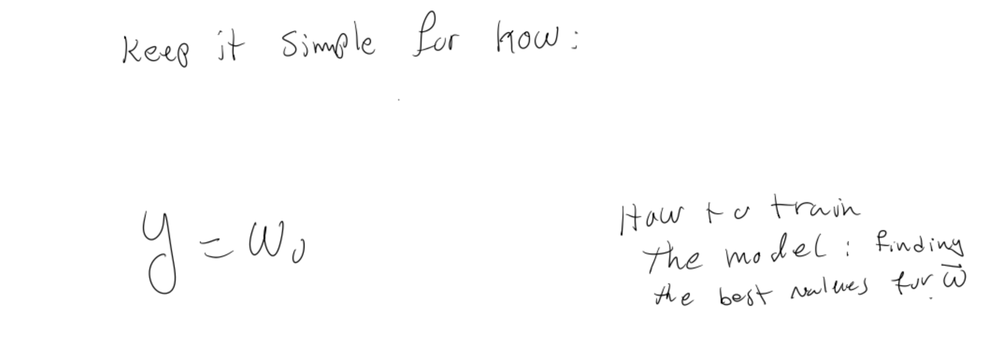

# =============================================================
# To tackle the problrm, first, we should define/choose a cost/lost function  
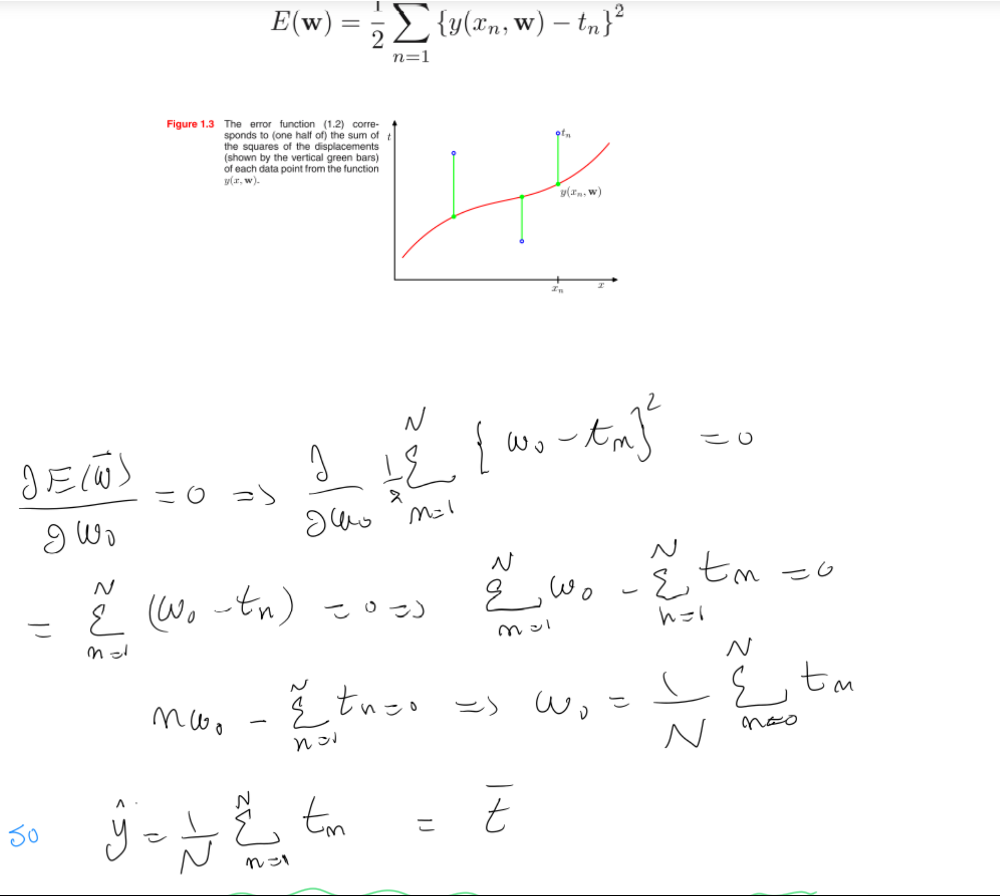
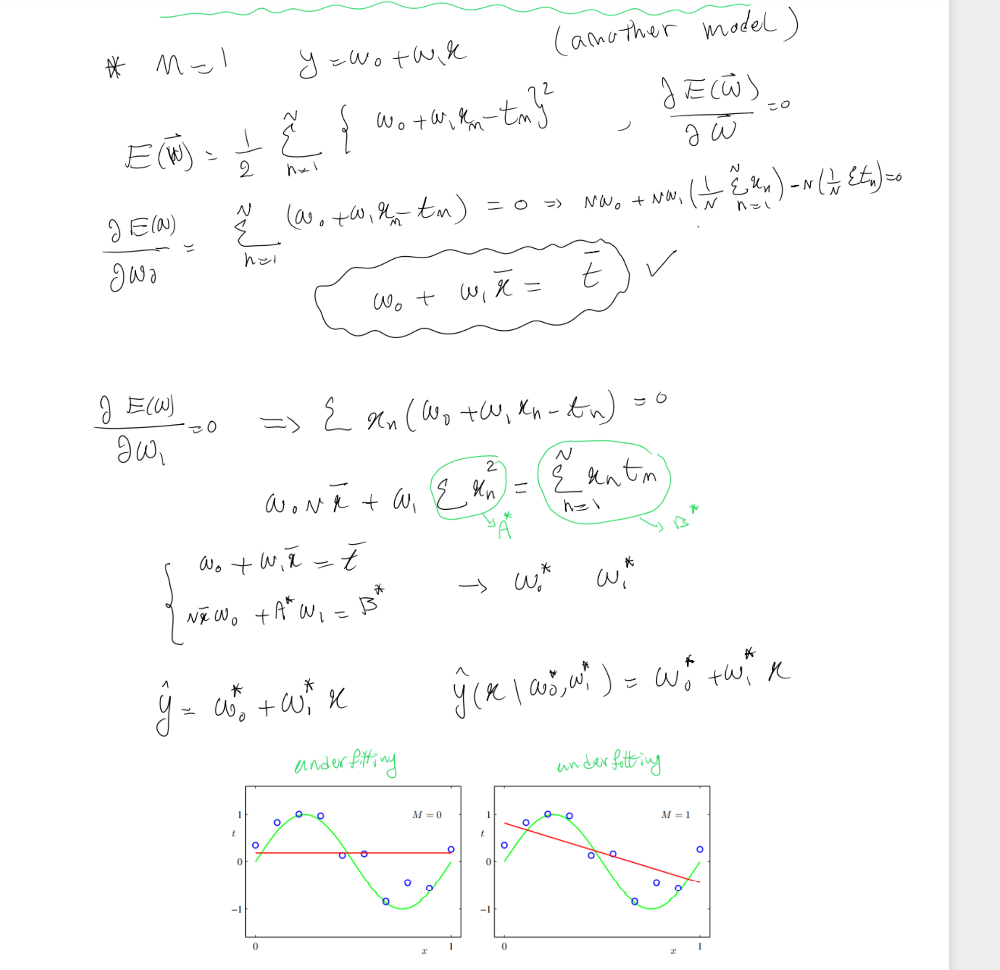
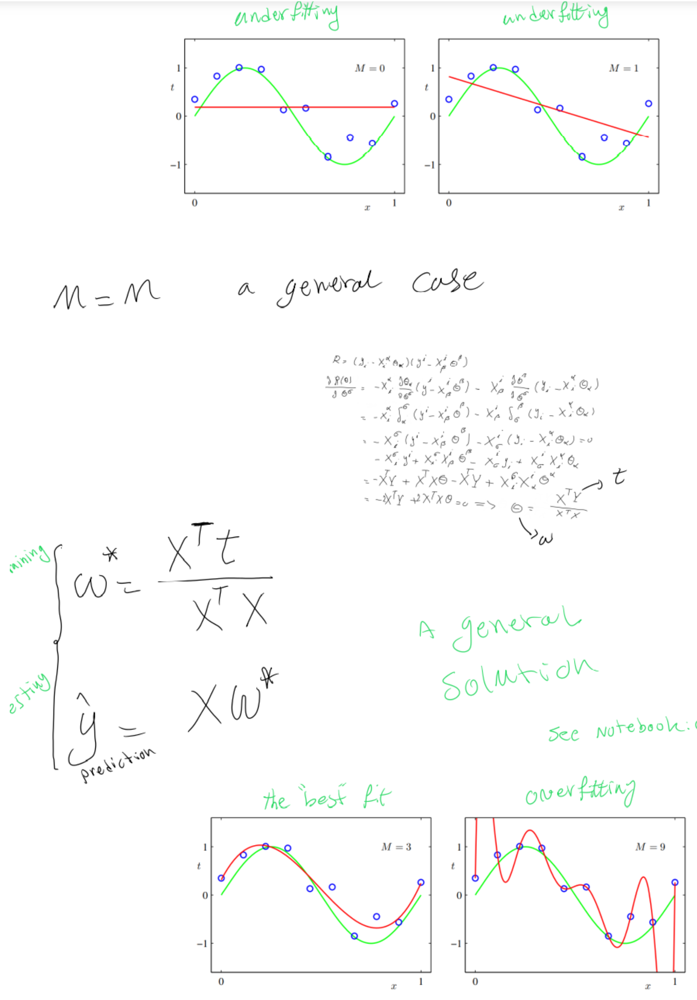
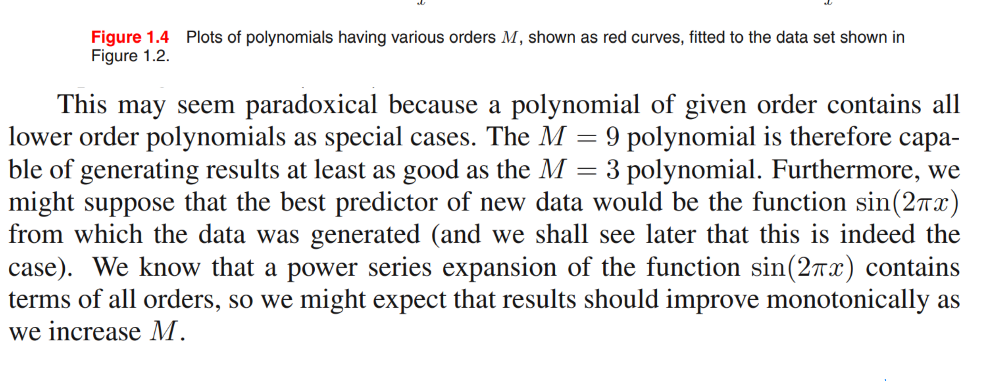
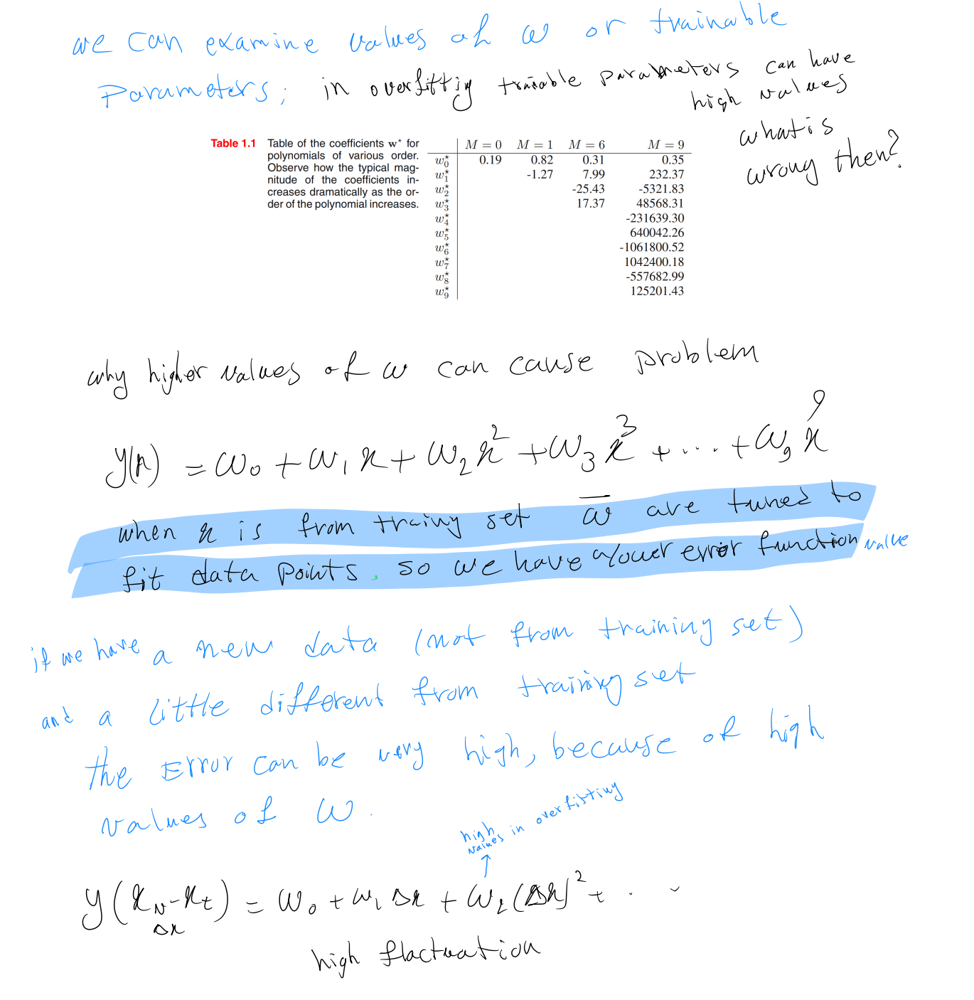

In [18]:
# choose the model 

degree=9

poly = PolynomialFeatures(degree,include_bias=True)

poly.fit(X)

X_feature_ext=poly.transform(X)

print(X_feature_ext, np.shape(X_feature_ext))

[[1.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00
  0.00000000e+00 0.00000000e+00]
 [1.00000000e+00 1.11111111e-01 1.23456790e-02 1.37174211e-03
  1.52415790e-04 1.69350878e-05 1.88167642e-06 2.09075158e-07
  2.32305731e-08 2.58117479e-09]
 [1.00000000e+00 2.22222222e-01 4.93827160e-02 1.09739369e-02
  2.43865264e-03 5.41922810e-04 1.20427291e-04 2.67616202e-05
  5.94702672e-06 1.32156149e-06]
 [1.00000000e+00 3.33333333e-01 1.11111111e-01 3.70370370e-02
  1.23456790e-02 4.11522634e-03 1.37174211e-03 4.57247371e-04
  1.52415790e-04 5.08052634e-05]
 [1.00000000e+00 4.44444444e-01 1.97530864e-01 8.77914952e-02
  3.90184423e-02 1.73415299e-02 7.70734663e-03 3.42548739e-03
  1.52243884e-03 6.76639485e-04]
 [1.00000000e+00 5.55555556e-01 3.08641975e-01 1.71467764e-01
  9.52598689e-02 5.29221494e-02 2.94011941e-02 1.63339967e-02
  9.07444263e-03 5.04135702e-03]
 [1.00000000e+00 6.66666667e-01 4.44444444e-01 2.96296296e

In [19]:

upper = (X_feature_ext.T).dot(t_noise)


lower= np.linalg.inv(X_feature_ext.T.dot(X_feature_ext))



W= lower.dot(upper)
#W= inv_XTX.dot(upper)
print ('W   ', W)


W    [[-8.74535390e-02]
 [ 2.12861814e+02]
 [-4.54398623e+03]
 [ 3.92165200e+04]
 [-1.77266539e+05]
 [ 4.65022492e+05]
 [-7.34590851e+05]
 [ 6.89394066e+05]
 [-3.54099359e+05]
 [ 7.66548307e+04]]


In [20]:
X_new= np.linspace(0,1,100,endpoint=True)

X_new = np.reshape(X_new,(-1,1))

print (np.shape(X_new))

X_new_feature_ext=poly.transform(X_new)


print (np.shape(X_new_feature_ext))



print (np.shape(W), np.shape(X_new_feature_ext))


y_h= X_new_feature_ext.dot(W)
                        

# y_h = np.reshape(y_h,(-1,1))

print (np.shape(y_h))


(100, 1)
(100, 10)
(10, 1) (100, 10)
(100, 1)


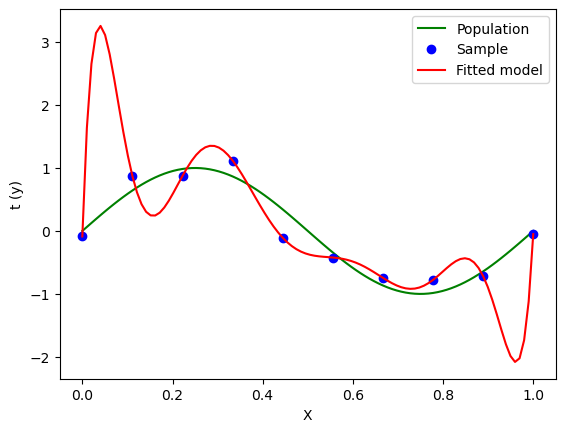

In [21]:
X_pop= np.linspace(0,1,100,endpoint=True)
t_pop = (np.sin(2*X_pop*np.pi))
plt.plot(X_pop,t_pop,'-g',label='Population')


plt.plot(X,t_noise,'ob', label='Sample')

plt.plot(X_new,y_h,'-r', label= 'Fitted model')

plt.xlabel('X')
plt.ylabel('t (y)')


plt.legend()
plt.show()

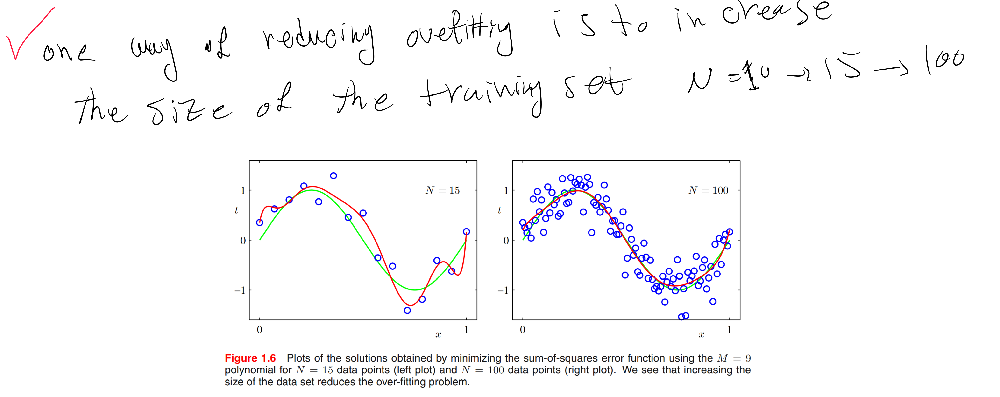

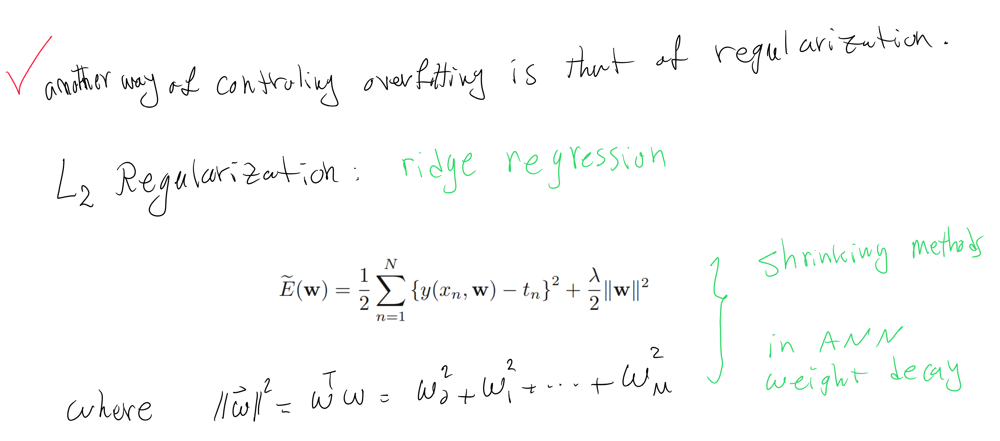
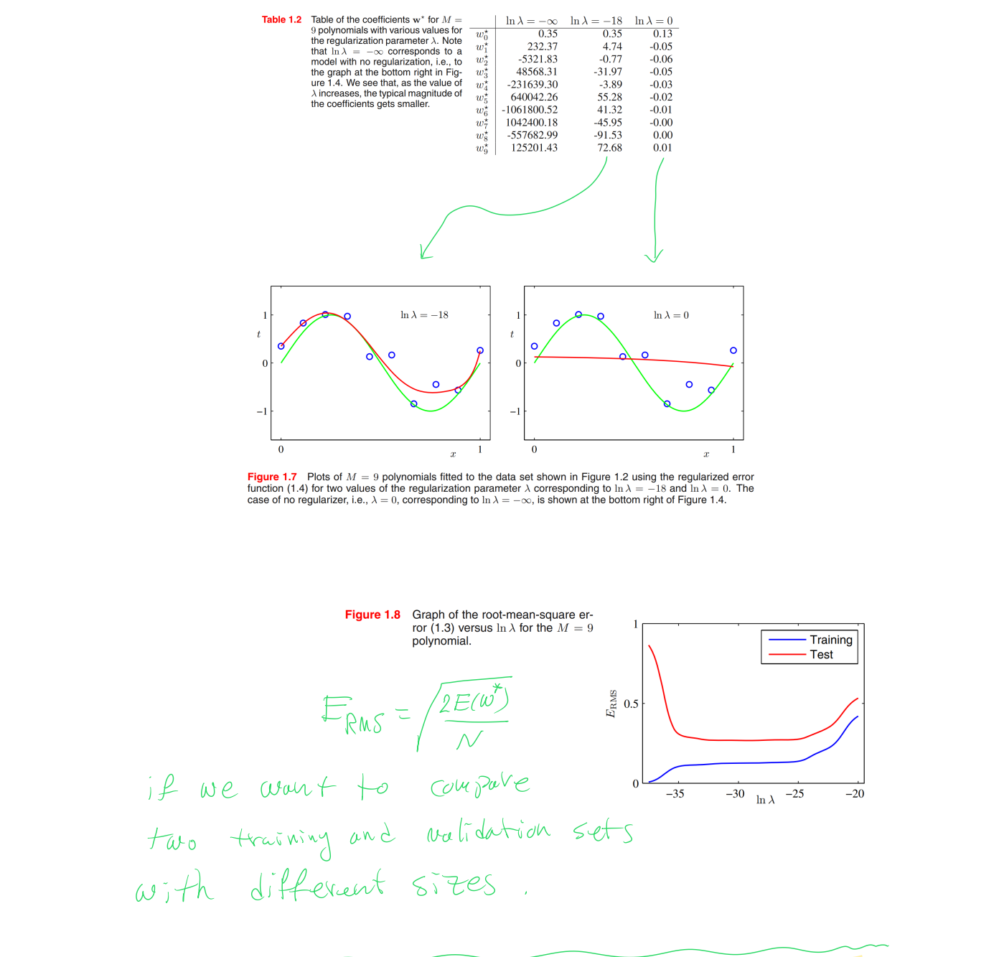

# ==============================================================

# The Goal: Predicting photometric redshift using photometric data (as the input) and spectroscopic redshift (as the target). You can use the original data or reduced (dimensionality) one.  
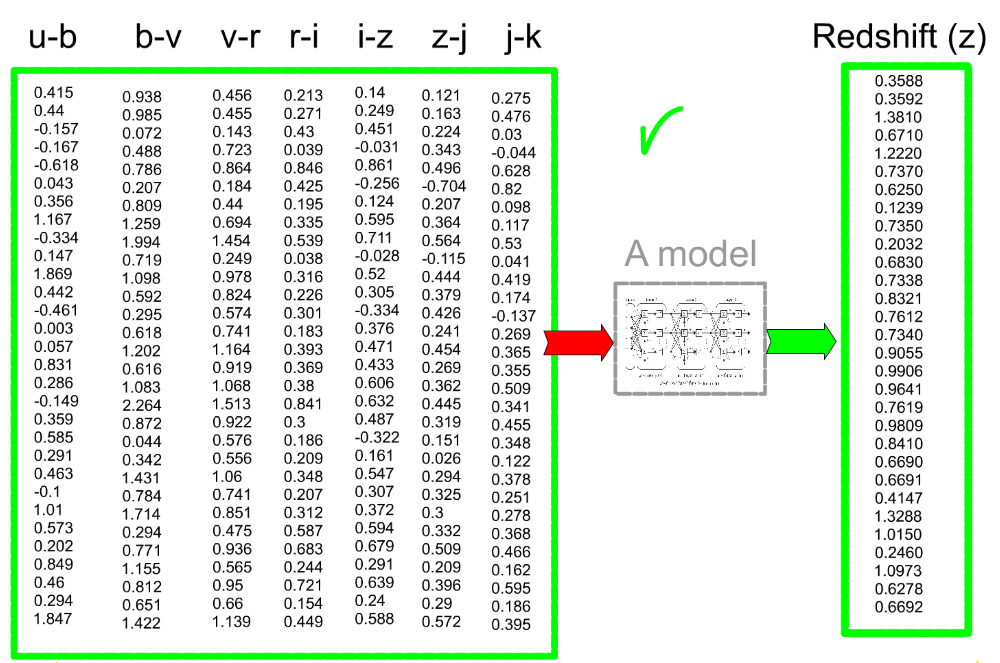

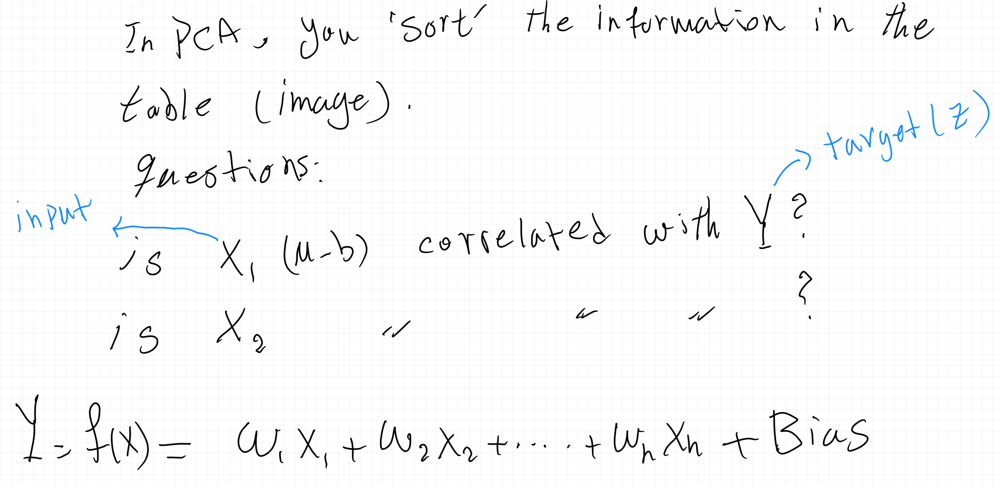

# A linear model
We can solve this problem using a closed form (an analytical approach) or an iterative algorithm(Gradient Descent).

# the closed form:



In [22]:
import numpy as np
from matplotlib import pyplot as plt
from sklearn.metrics import mean_squared_error

X=np.load('inp_redshift.npy')
Y=np.load('tar_redshift.npy')
Y = Y.reshape(-1,1)
np.shape(X)



(713, 7)

In [23]:
degree=1

poly = PolynomialFeatures(degree,include_bias=True)

poly.fit(X)

X_feature_ext=poly.transform(X)

print(X_feature_ext, np.shape(X_feature_ext))

[[ 1.     0.415  0.938 ...  0.14   0.121  0.275]
 [ 1.     0.44   0.985 ...  0.249  0.163  0.476]
 [ 1.    -0.157  0.072 ...  0.451  0.224  0.03 ]
 ...
 [ 1.     0.875  0.472 ...  0.288  0.37   0.038]
 [ 1.     0.249  0.841 ...  0.128  0.313  0.04 ]
 [ 1.     0.741  0.1   ... -0.336  1.022  0.043]] (713, 8)


In [24]:
print(np.shape(X_feature_ext))

(713, 8)


In [25]:


lower= np.linalg.inv(X_feature_ext.T.dot(X_feature_ext))


upper = (X_feature_ext.T).dot(Y)


W= lower.dot(upper)
#theta= inv_XTX.dot(upper)
print (W)

[[ 0.6163148 ]
 [-0.04506559]
 [-0.46145393]
 [ 0.26126341]
 [ 0.9199264 ]
 [ 0.13521234]
 [ 0.02370966]
 [-0.05846229]]


In [26]:
Y_pre= X_feature_ext.dot(W)

In [27]:
print(np.shape(Y_pre))


(713, 1)


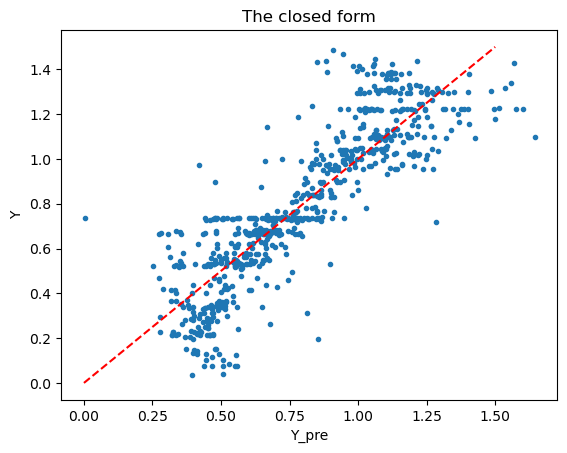

In [28]:
plt.plot(Y_pre,Y,'.')
plt.xlabel('Y_pre')
plt.ylabel('Y')
plt.title('The closed form')
plt.plot([0,1.5],[0,1.5],'--r')

Text(0, 0.5, 'N')

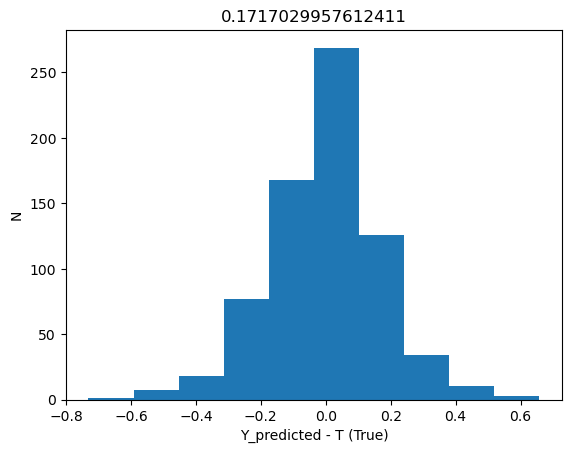

In [29]:

plt.hist(Y_pre-Y)
plt.title(str(np.std(Y_pre-Y)))
plt.xlabel('Y_predicted - T (True)')
plt.ylabel('N')
#plt.title('The closed form')


In [30]:
mean_squared_error(Y, Y_pre)  # the 

0.029481918753384774

# ==============================================================
# the optimization method
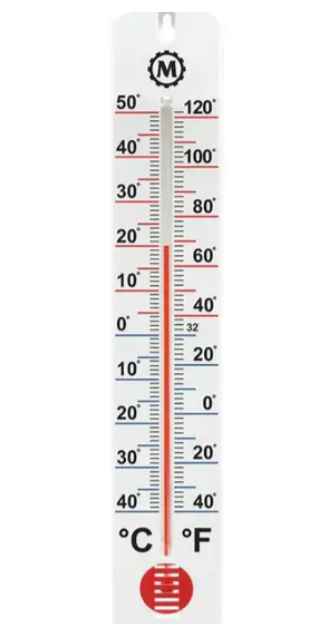
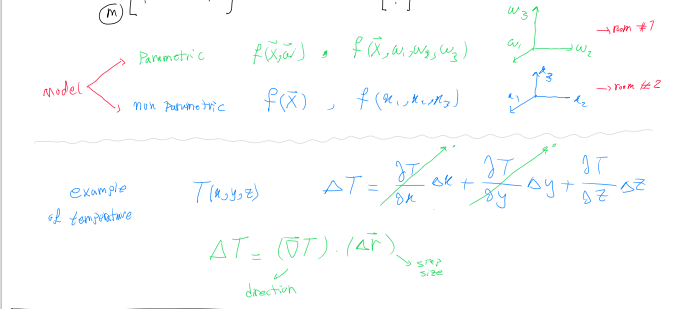
# ==============================================================
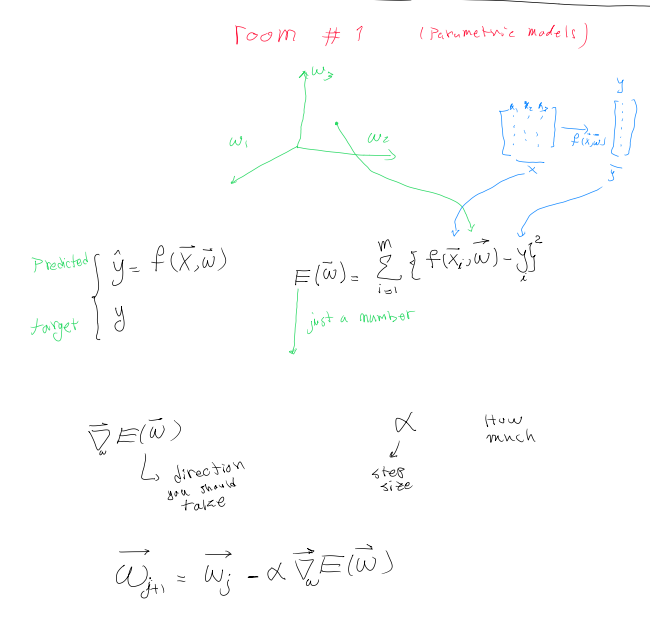
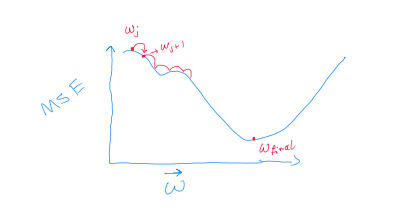
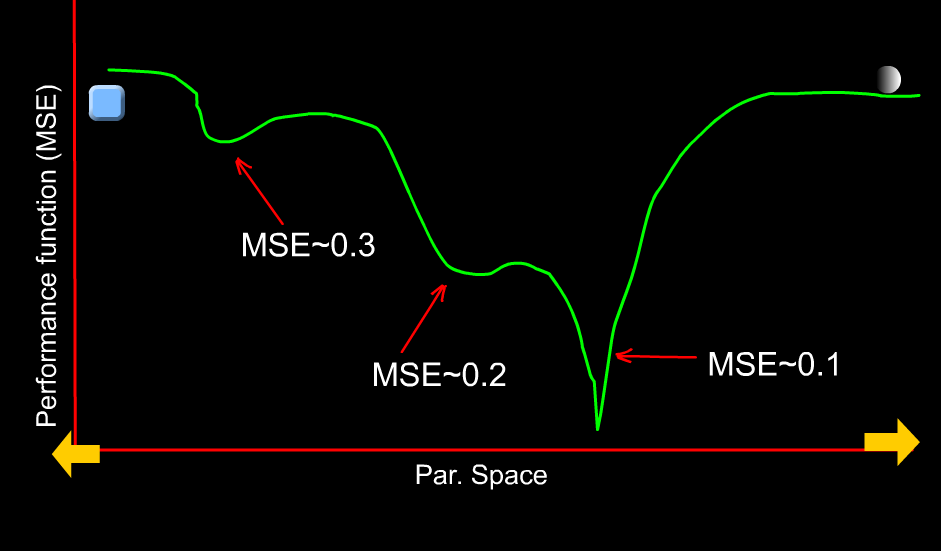

# Loading packages

In [31]:
%matplotlib inline
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from pandas.plotting import scatter_matrix    
from sklearn.neighbors import KNeighborsRegressor
import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
from sklearn import linear_model
import sys
from scipy.interpolate import interp1d
from matplotlib import pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
print('Done!')



Done!


In [32]:
X=np.load('inp_redshift.npy')  # load the input
Y=np.load('tar_redshift.npy')  # load the target

In [33]:
print(np.shape(X),np.shape(Y)) #Check the size and dimension of the input and the target

(713, 7) (713,)


# Exploring the data and seeing the distribution of a selected column

Text(0.5, 0, 'X5')

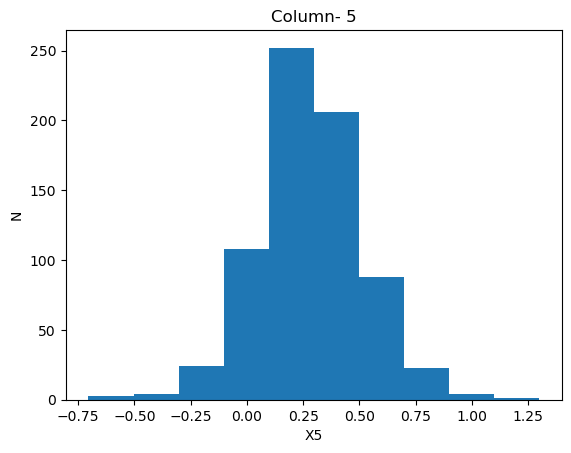

In [34]:
# Choose a column to see the distribution

n_column = 5

plt.hist(X[:,n_column])
plt.title('Column- '+str(n_column))
plt.ylabel('N')
plt.xlabel("X"+str(n_column))

# Randomly separate 713 samples to the training set (75%) and validation set (25%). The corresponding targets are also separated. 

In [35]:
from sklearn.model_selection import train_test_split
X_tr,X_va,Y_tr, Y_va = train_test_split(X,Y ,test_size=0.25)

print ('training set == ',np.shape(X_tr),np.shape(Y_tr),',, validation set == ', np.shape(X_va),np.shape(Y_va))

training set ==  (534, 7) (534,) ,, validation set ==  (179, 7) (179,)


# Normalization.


In [36]:
#Line #1: Import a model, for normalization, like StandardScaler (https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html)

#Line #2: fitting (finding the parameters of the model based on the training set). Assign a name (scaler_S which can transform a new data after training)

#Line #3: Predicted (transformed) values for the training set

#Line #4: Predicted (transformed) values for the validation set (using the model that has been trained using the training set).


from sklearn.preprocessing import StandardScaler, MinMaxScaler  #line #1

scaler_S= StandardScaler().fit(X_tr)  # line #2
X_tr_Norm= scaler_S.transform(X_tr) # line # 3

X_va_Norm= scaler_S.transform(X_va)  # Line #4

print('Done!')

Done!


# Comparing the distributions from the nomalized training and validation sets

Text(0.5, 0, 'X0')

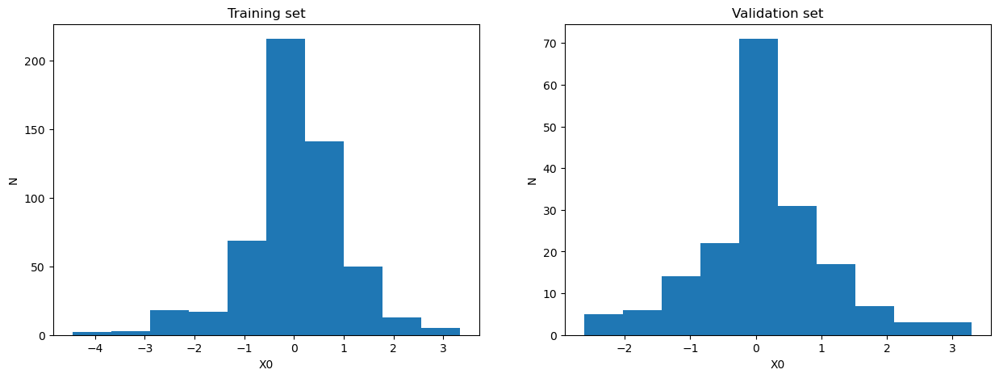

In [37]:
n_column = 0

fig = plt.figure(figsize=(15, 5))

plt.subplot(1, 2, 1)
plt.hist(X_tr_Norm[:,n_column])
plt.title('Training set')
plt.ylabel('N')
plt.xlabel("X"+str(n_column))


plt.subplot(1, 2, 2)
plt.hist(X_va_Norm[:,n_column])
plt.title('Validation set')
plt.ylabel('N')
plt.xlabel("X"+str(n_column))

In [38]:
# Change the shape of the target (if you have a one-component  target )
# Y=np.reshape(Y,-1)
# print(np.shape(X),np.shape(Y))   

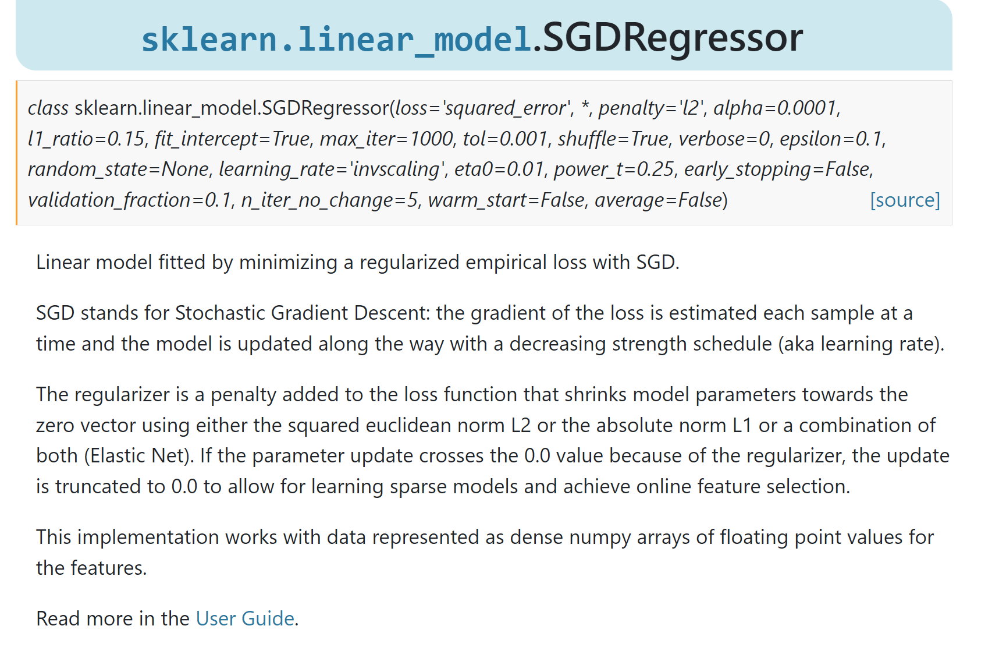

https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDRegressor.html

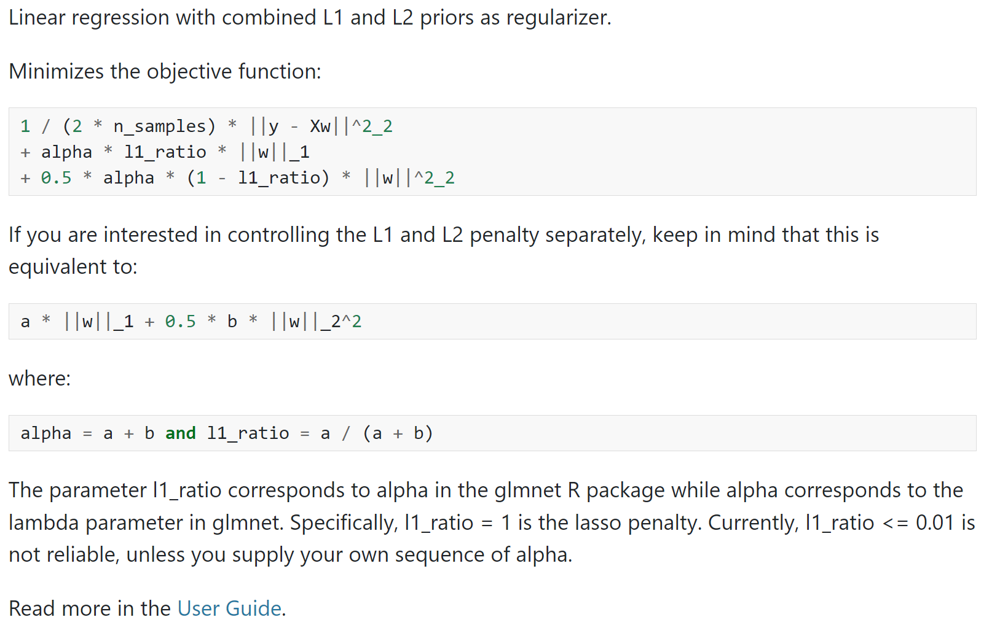

https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html

C:\Users\Karlee\miniconda3\envs\phys555\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:169: FutureWarning: The loss 'squared_loss' was deprecated in v1.0 and will be removed in version 1.2. Use `loss='squared_error'` which is equivalent.
  FutureWarning,
C:\Users\Karlee\miniconda3\envs\phys555\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:1507: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  ConvergenceWarning,


Text(2.1, 0.05, '$\\mu=0.0516$\n$\\mathrm{med}=0.0648$\n$\\sigma=0.1864$')

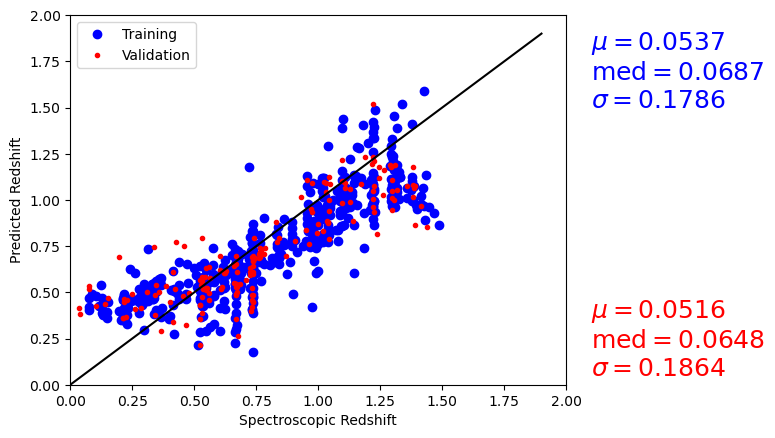

In [54]:


reg= linear_model.SGDRegressor(loss='squared_loss', penalty='L2', alpha=0.000001, l1_ratio=0.15, 
                                        fit_intercept=True, max_iter=5, tol=0.001, shuffle=True, verbose=0, 
                                        epsilon=0.1, random_state=None, learning_rate='constant', eta0=0.001, 
                                        power_t=0.25, early_stopping=False, validation_fraction=0.1, 
                                        n_iter_no_change=5, warm_start=False, average=False)

#eta0 is the step size (learning rate)

reg.fit (X_tr_Norm,Y_tr)  # fit the model with training set

#'predictions for training and validation sets'
Y_tr_pred= reg.predict(X_tr_Norm)  
Y_va_pred= reg.predict(X_va_Norm)


plt.figure(3)
plt.plot(Y_tr,Y_tr_pred,'ob')
plt.plot(Y_va,Y_va_pred,'.r')

plt.plot(np.arange(0,2,.1),  np.arange(0,2,.1),'-k')
plt.xlabel('Spectroscopic Redshift')
plt.ylabel('Predicted Redshift')
plt.legend(['Training', 'Validation'])
plt.xlim([0,2])
plt.ylim([0,2])

#Statistical information regarding training and validation predictions
mu = np.mean(Y_tr-Y_tr_pred)
median = np.median(Y_tr-Y_tr_pred)
sigma = np.std(Y_tr-Y_tr_pred)

muv = np.mean(Y_va-Y_va_pred)
medianv = np.median(Y_va-Y_va_pred)
sigmav = np.std(Y_va-Y_va_pred)

textstr = '$\mu=%.4f$\n$\mathrm{med}=%.4f$\n$\sigma=%.4f$'%(mu, median, sigma)
textstrv = '$\mu=%.4f$\n$\mathrm{med}=%.4f$\n$\sigma=%.4f$'%(muv, medianv, sigmav)


plt.text(2.1,1.5,textstr, color='b',fontsize=18)
plt.text(2.1,.05,textstrv, color='r',fontsize=18)


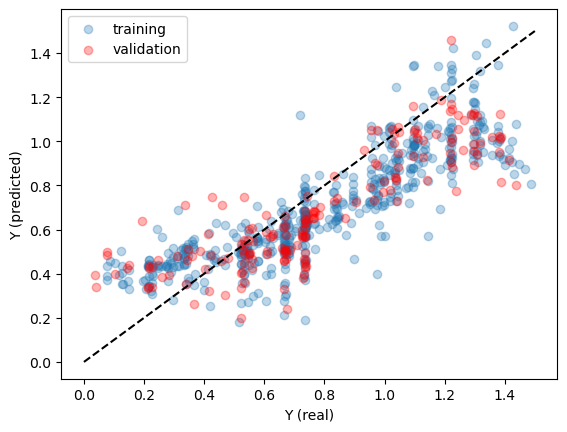

In [40]:
# The same as above, with different visualization
plt.scatter(Y_tr,Y_tr_pred,label='training',alpha=.3)
plt.scatter(Y_va,Y_va_pred,label='validation',color='r',alpha=.3) 
plt.xlabel('Y (real)')
plt.ylabel('Y (predicted)')
plt.plot([0,1.5],[0,1.5],'--k')
plt.legend()

# Comparing predicted and actual values

mean =  -0.09349738623035474
median =  -0.11274648750115346
SD =  0.18230936079953738


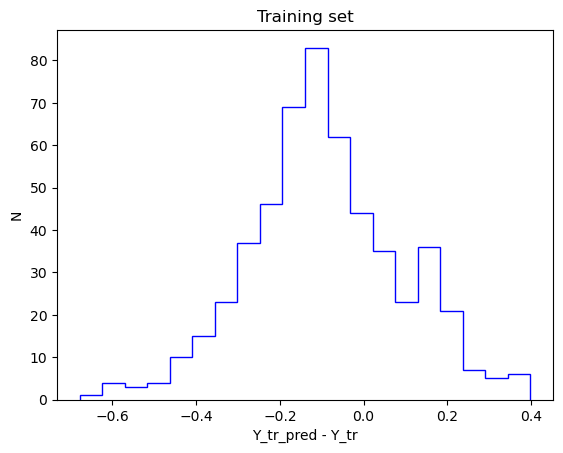

In [41]:
# Inspect the distribution of the difference between the predicted and actual values for the training set (A Gaussian distribution is expected)
plt.hist(Y_tr_pred-Y_tr,20,color='b',histtype='step')
plt.xlabel('Y_tr_pred - Y_tr')
plt.ylabel('N')
plt.title('Training set')
print ('mean = ',np.mean(Y_tr_pred-Y_tr) )
print ('median = ',np.median(Y_tr_pred-Y_tr) )
print ('SD = ',np.std(Y_tr_pred-Y_tr) )

mean =  -0.09129733152902168
median =  -0.10230922524910102
SD =  0.19014092492999612


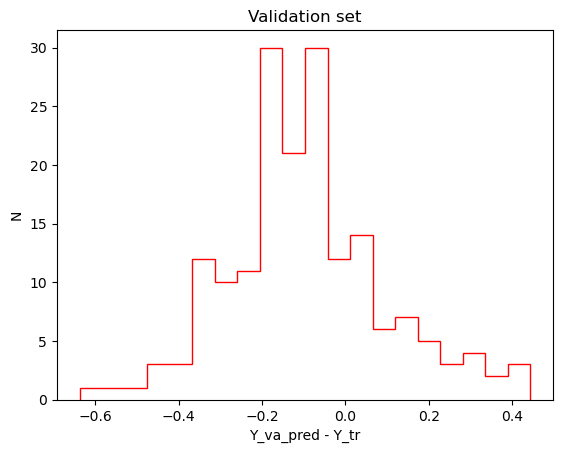

In [42]:
# Inspect the distribution of the difference between the predicted and actual values for the validation set (A Gaussian distribution is expected)
plt.hist(Y_va_pred-Y_va,20,color='r',histtype='step')
plt.xlabel('Y_va_pred - Y_tr')
plt.ylabel('N')
plt.title('Validation set')

print ('mean = ',np.mean(Y_va_pred-Y_va) )
print ('median = ',np.median(Y_va_pred-Y_va) )
print ('SD = ',np.std(Y_va_pred-Y_va) )

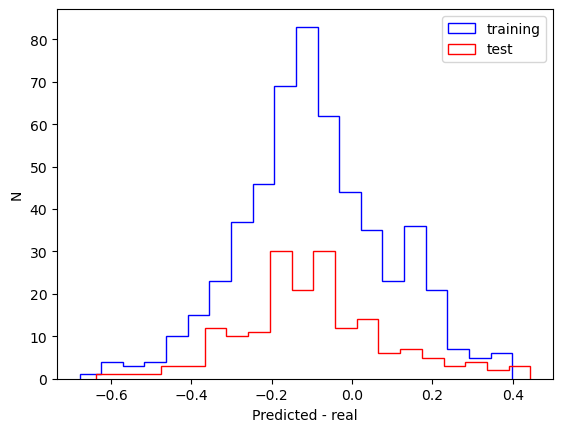

In [43]:
# Inspect the distribution of the difference between the predicted and actual values for the two sets (A Gaussian distribution is expected)

plt.hist(Y_tr_pred-Y_tr,20,color='b',histtype='step',label='training')
plt.hist(Y_va_pred-Y_va,20,color='r',histtype='step',label='test')
plt.xlabel('Predicted - real')
plt.ylabel('N')
plt.legend()



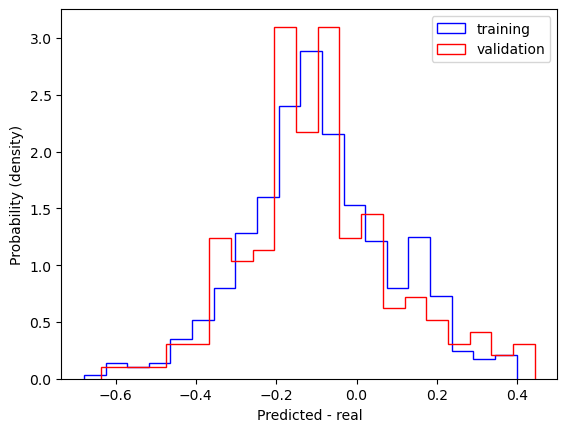

In [44]:
# If the size validation set and training set are different, 
# it would be better to normalize the distributions for a better comparison.

plt.hist(Y_tr_pred-Y_tr,20,color='b',histtype='step',density=True,label='training')
plt.hist(Y_va_pred-Y_va,20,color='r',histtype='step',density=True,label='validation')
plt.xlabel('Predicted - real')
plt.ylabel('Probability (density)')
plt.legend()


# Inspecting systematic errors.  The best is to have asymmetric Gaussian density around the dashed line

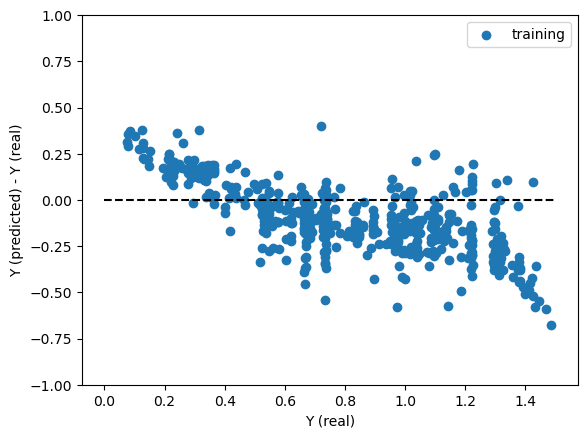

In [45]:
# Inspecting systematic errors for the training set
plt.scatter(Y_tr,Y_tr_pred-Y_tr,label='training')
plt.xlabel('Y (real)')
plt.ylabel('Y (predicted) - Y (real)')
plt.plot([0,1.5],[0,0],'--k')
plt.ylim([-1,1])
plt.legend()

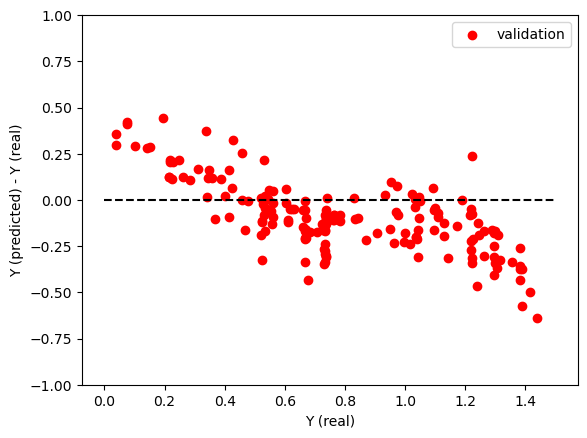

In [46]:
# Inspecting systematic errors for the validation set
plt.scatter(Y_va,Y_va_pred-Y_va,label='validation',color='r')
plt.xlabel('Y (real)')
plt.ylabel('Y (predicted) - Y (real)')
plt.plot([0,1.5],[0,0],'--k')
plt.ylim([-1,1])
plt.legend()

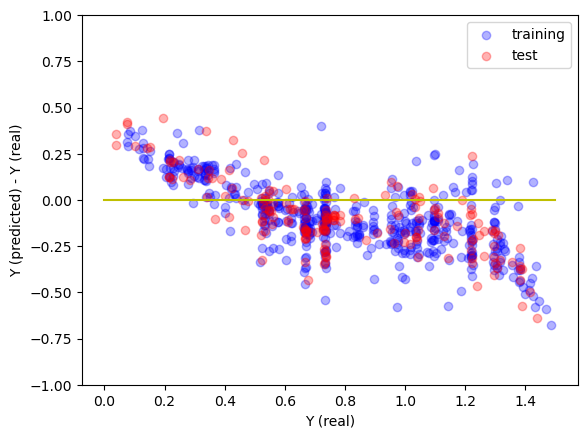

In [47]:
# Inspecting systematic errors for the training set and validation set together 

plt.scatter(Y_tr,Y_tr_pred-Y_tr,label='training',color='b',alpha=.3)
plt.scatter(Y_va,Y_va_pred-Y_va,label='test',color='r',alpha=.3)
plt.xlabel('Y (real)')
plt.ylabel('Y (predicted) - Y (real)')
plt.plot([0,1.5],[0,0],'y')
plt.ylim([-1,1])
plt.legend()

# Feature extraction and fitting 

In [48]:
degree= 2


# for example, if  degree = 2 and if we have 7 columns, then the following line creates a table of 36 
#columns of the possible combination to power 2combinations
poly = PolynomialFeatures(degree,include_bias=False)


poly.fit(X_tr_Norm)  # fitting the model based on the training set

X_tr_Norm_Ext=poly.transform(X_tr_Norm)  # transforming the training set 

X_va_Norm_Ext=poly.transform(X_va_Norm)  # transforming the validation set 

print ('size and dimension of training set = ', np.shape(X_tr_Norm_Ext))
print ('size and dimension of validation set = ', np.shape(X_va_Norm_Ext))

size and dimension of training set =  (534, 35)
size and dimension of validation set =  (179, 35)


C:\Users\Karlee\miniconda3\envs\phys555\lib\site-packages\sklearn\linear_model\_stochastic_gradient.py:169: FutureWarning: The loss 'squared_loss' was deprecated in v1.0 and will be removed in version 1.2. Use `loss='squared_error'` which is equivalent.
  FutureWarning,


Text(2.1, 0.05, '$\\mu=-0.0074$\n$\\mathrm{med}=-0.0019$\n$\\sigma=0.1400$')

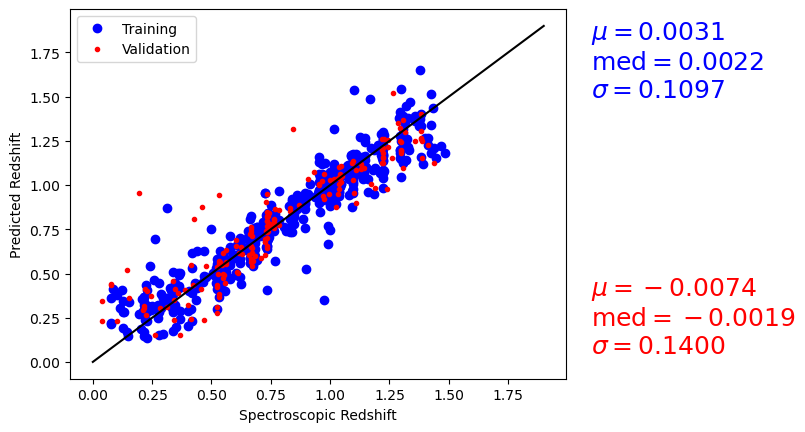

In [49]:
reg= linear_model.SGDRegressor(loss='squared_loss', penalty='L2', alpha=.000001, l1_ratio=0.15, 
                                        fit_intercept=True, max_iter=1000000, tol=0.000001, shuffle=True, verbose=0, 
                                        epsilon=0.1, random_state=None, learning_rate='constant', eta0=0.001, 
                                        power_t=0.25, early_stopping=False, validation_fraction=0.1, 
                                        n_iter_no_change=5, warm_start=False, average=False)

# early stopping is how far after the validation set starts to have an increase in error, so stop when that happens. 
# the n_iter_no_change is how many iterations after that has happened 

reg.fit (X_tr_Norm_Ext,Y_tr)  # fit the model with training set

#'predictions for training and validation sets'
Y_tr_pred= reg.predict(X_tr_Norm_Ext)  
Y_va_pred= reg.predict(X_va_Norm_Ext)


plt.figure(3)
plt.plot(Y_tr,Y_tr_pred,'ob')
plt.plot(Y_va,Y_va_pred,'.r')

plt.plot(np.arange(0,2,.1),  np.arange(0,2,.1),'-k')
plt.xlabel('Spectroscopic Redshift')
plt.ylabel('Predicted Redshift')
plt.legend(['Training', 'Validation'])
#plt.xlim([0,2])
#plt.ylim([0,2])

#Statistical information regarding training and validation predictions
mu = np.mean(Y_tr-Y_tr_pred)
median = np.median(Y_tr-Y_tr_pred)
sigma = np.std(Y_tr-Y_tr_pred)

muv = np.mean(Y_va-Y_va_pred)
medianv = np.median(Y_va-Y_va_pred)
sigmav = np.std(Y_va-Y_va_pred)

textstr = '$\mu=%.4f$\n$\mathrm{med}=%.4f$\n$\sigma=%.4f$'%(mu, median, sigma)
textstrv = '$\mu=%.4f$\n$\mathrm{med}=%.4f$\n$\sigma=%.4f$'%(muv, medianv, sigmav)


plt.text(2.1,1.5,textstr, color='b',fontsize=18)
plt.text(2.1,.05,textstrv, color='r',fontsize=18)


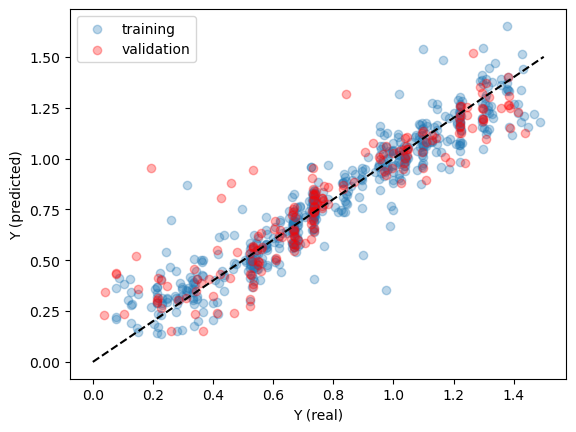

In [50]:
# The same as above, with different visualization
plt.scatter(Y_tr,Y_tr_pred,label='training',alpha=.3)
plt.scatter(Y_va,Y_va_pred,label='validation',color='r',alpha=.3) 
plt.xlabel('Y (real)')
plt.ylabel('Y (predicted)')
plt.plot([0,1.5],[0,1.5],'--k')
plt.legend()

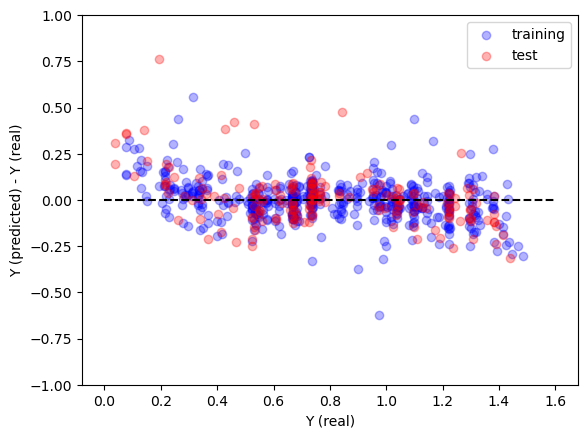

In [51]:
# Inspecting systematic errors for the training set and validation set together 

plt.scatter(Y_tr,Y_tr_pred-Y_tr,label='training',color='b',alpha=.3)
plt.scatter(Y_va,Y_va_pred-Y_va,label='test',color='r',alpha=.3)
plt.xlabel('Y (real)')
plt.ylabel('Y (predicted) - Y (real)')
plt.plot([0,1.6],[0,0],'--k')
plt.ylim([-1,1])
plt.legend()